In [1]:
!pip install gym

In [2]:
import gym
from gym import spaces
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import time
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
from IPython.display import clear_output
import struct
import pandas as pd
import json

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=

In [ ]:
trial_info = "DQN_1"

#Pendulum Model

In [71]:
class ReactionWheelPendulumEnv(gym.Env):
    def __init__(self, threshold_angle, max_time, target_balance_time, time_step=0.01, simulate=False):
        super(ReactionWheelPendulumEnv, self).__init__()

        # Define action space (discrete motor speeds in RPM)
        self.rpm_to_rad_s = np.array([-400, -350, -300, -250, -200, -150, -100, -50, 0,
                                      50, 100, 150, 200, 250, 300, 350, 400]) * (np.pi / 30)
        self.action_space = spaces.Discrete(self.rpm_to_rad_s.shape[0])

        # Define observation space (state: [theta, theta_dot, omega, omega_dot])
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(3,), dtype=np.float32
        )

        # Parameters for the dynamics
        self.omega_n, self.zeta, self.k, self.cv = [38.099992002045674, 0.018765394864028125,
                                                    1443.4698748845892, 0.08390404004978032]
        self.Mp, self.lpcm, self.Ipo, self.Mr, self.lrcm, self.Ir, self.b = [
                                0.020373638605075156, 0.06504904820060829, 1.3078582648642452e-05,
                                0.155, 0.11, 0.00021453606127182941,
                                0.0008955443074902268]
        self.g = 9.8

        self.It = (self.Ipo + self.Mr*(self.lrcm**2) + self.Ir)
        self.Kmgl = (self.Mr*self.lrcm + self.Mp*self.lpcm)*self.g
        self.I = self.It + self.Ir

        self.threshold_angle = np.deg2rad(threshold_angle)
        self.time_step = time_step  # Simulation time step
        self.max_steps = max_time/self.time_step
        self.target_balance_steps = target_balance_time/self.time_step
        self.current_step = 0
        self.simulate=simulate

        # Initialize state
        self.state = None

        # Noise parameters
        self.noise_std = 0.01  # Standard deviation of Gaussian noise

        self.is_upright = False
        self.balance_steps = 0
        self.max_balance_steps = 0
        self.total_balance_steps = []
        self.fell = False

    def dynamics(self, t, state, u):
        theta, theta_dot, omega, omega_dot = state
        theta_ddot = (
            (self.Kmgl / self.I) * np.sin(theta)
            - (self.b / self.I) * theta_dot
            - (self.Ir / self.I) * omega_dot
        )
        omega_ddot = (
            self.k * u
            - (2 * self.zeta * self.omega_n + self.cv * abs(omega_dot)) * omega_dot
            - (self.omega_n ** 2) * omega
        )
        return [theta_dot, theta_ddot, omega_dot, omega_ddot]

    def step(self, action):
        self.current_step += 1
        # Convert discrete action to rad/s
        u = self.rpm_to_rad_s[action]  # Map action to rad/s

        # Define time span for integration
        t_span = [self.current_time, self.current_time + self.time_step]

        # Solve dynamics equations
        sol = solve_ivp(self.dynamics, t_span, self.state, method='DOP853', args=(u,),
                        t_eval = [t_span[-1]], dense_output=True, rtol=1e-10, atol=1e-10)

        # Update state
        self.state = sol.y[:, -1]

        # Add noise to the state
        #self.state += np.random.normal(0, self.noise_std, size=self.state.shape)

        # Update current time
        self.current_time += self.time_step

        # Extract state variables
        theta, theta_dot, omega, omega_dot = self.state

        # Calculate reward
        theta_error = np.deg2rad(np.rad2deg(theta)%360)
        if theta_error > np.pi:
          theta_error = 2*np.pi - theta_error
        reward = -(theta_error**2)
        fell = False
        is_upright = abs(theta_error) < self.threshold_angle
        if is_upright:
          self.balance_steps += 1
          reward = 1 - (theta_error**2 + 0.001*theta_dot**2 + 0.005*u**2)
        else:
          if self.balance_steps > 0:
            fell = True
            self.total_balance_steps.append(self.balance_steps)
            # reward = -100
          self.balance_steps = 0

        if self.balance_steps > self.max_balance_steps:
          self.max_balance_steps = self.balance_steps

        # Define done condition (e.g., pendulum angle too large)
        terminated = True if self.balance_steps > self.target_balance_steps else False
        truncated = True if self.current_step >= self.max_steps else False
        if fell:
          reward = -100

        info = {
                "current_step": self.current_step,
                "balance_time": self.total_balance_steps and np.mean(self.total_balance_steps) or 0.0,
                "max_balance_time": self.max_balance_steps,
        }

        # Return step information
        agent_state = np.copy(self.state[:-1])
        temp = np.rad2deg(agent_state[0])%360
        temp = temp if temp <= 180.0 else temp - 360.0
        agent_state[0] = np.deg2rad(temp)
        return np.array(agent_state, dtype=np.float32), reward, terminated, truncated, info


    def reset(self, seed=None, options=None):
        super().reset(seed=seed)

        initial_theta = np.pi
        initial_theta_dot = np.random.randint(-10, 10 + 1) * (np.pi / 30)

        self.state = np.array([
            initial_theta,          # Initial angle
            initial_theta_dot,      # Initial angular velocity
            0.0,                    # Initial wheel speed
            0.0                     # Initial wheel angular acceleration
        ], dtype=np.float32)

        self.current_time = 0
        self.current_step = 0
        self.is_upright = False
        self.balance_time = 0.0
        self.fell = False
        self.max_balance_time = 0
        self.total_balance_steps = []

        # Return the initial observation
        agent_state = np.copy(self.state[:-1])
        temp = np.rad2deg(agent_state[0])%360
        temp = temp if temp <= 180.0 else temp - 360.0
        agent_state[0] = np.deg2rad(temp)
        return np.array(agent_state, dtype=np.float32), {}

    def render(self, mode='human'):
        pass  # Optional: Implement visualization

    def close(self):
        pass

In [5]:
class ReplayBuffer:
  def __init__(self, MAX_SIZE, OBS_SPACE_SIZE, BATCH_SIZE):
    self.max_size = MAX_SIZE
    self.batch_size = BATCH_SIZE
    self.ptr = 0
    self.size = 0
    self.obs_buffer = np.zeros((MAX_SIZE, OBS_SPACE_SIZE), dtype = np.float32)
    self.next_obs_buffer = np.zeros((MAX_SIZE, OBS_SPACE_SIZE), dtype = np.float32)
    self.action_buffer = np.zeros([MAX_SIZE], dtype = np.float32)
    self.reward_buffer = np.zeros([MAX_SIZE], dtype = np.float32)
    self.done_buffer = np.zeros([MAX_SIZE], dtype = np.float32)

  def store(self, current_state, action, next_state, reward, done):
    self.obs_buffer[self.ptr] = current_state
    self.action_buffer[self.ptr] = action
    self.next_obs_buffer[self.ptr] = next_state
    self.reward_buffer[self.ptr] = reward
    self.done_buffer[self.ptr] = done

    self.ptr = (self.ptr + 1) % self.max_size
    self.size = min(self.size + 1, self.max_size)

  def sample_batch(self):
    index_array = np.random.choice(self.size, self.batch_size, replace = False)
    return dict(obs = self.obs_buffer[index_array],
                actions = self.action_buffer[index_array],
                new_obs = self.next_obs_buffer[index_array],
                rewards = self.reward_buffer[index_array],
                done = self.done_buffer[index_array])

  def __len__(self):
    return self.size

In [6]:
class NeuralNetwork(nn.Module):

  def __init__(self, in_dim, out_dim):
    super(NeuralNetwork, self).__init__()
    hidden_neurons = 16
    self.layers = nn.Sequential(
        nn.Linear(in_dim, hidden_neurons),
        nn.ReLU(),
        nn.Linear(hidden_neurons , hidden_neurons ),
        nn.ReLU(),
        nn.Linear(hidden_neurons , hidden_neurons ),
        nn.ReLU(),
        nn.Linear(hidden_neurons , out_dim)
    )

    self._initialize_weights()

  def _initialize_weights(self):
    # Apply Xavier initialization to all layers
    for layer in self.layers:
      if isinstance(layer, nn.Linear):
        nn.init.xavier_uniform_(layer.weight)
        nn.init.zeros_(layer.bias)  # Initialize biases to zero

  def forward(self, x):
      return self.layers(x)


In [37]:
class DQNAgent:
  def __init__(self, env, replay_memory_size, batch_size, target_update_every, epsilon_decay, min_epsilon, max_epsilon, gamma):
    self.env = env
    self.replay_memory = ReplayBuffer(replay_memory_size, env.observation_space.shape[0], batch_size)
    self.target_update_every = target_update_every
    self.epsilon_decay = epsilon_decay
    self.min_epsilon = min_epsilon
    self.max_epsilon = max_epsilon
    self.epsilon = max_epsilon
    self.gamma = gamma

    self.device = torch.device("cuda" if torch.cuda.is_available else "cpu")

    self.dqn = NeuralNetwork(env.observation_space.shape[0], env.action_space.n)
    self.target_dqn = NeuralNetwork(env.observation_space.shape[0], env.action_space.n)
    self.target_dqn.load_state_dict(self.dqn.state_dict())
    self.target_dqn.eval()

    self.optimizer = torch.optim.Adam(self.dqn.parameters())

    self.is_test = False

    self.training_logs = {
                        "episode": [],
                        "episode_reward": [],
                        "epsilon": [],
                        "balance_time": [],
                        "success": [],
                        "loss": []
                       }

    print("Agent Initialized")

  def epsilon_greedy(self, state):
    if self.epsilon > np.random.random():
      action = self.env.action_space.sample()
    else:
      action = self.dqn.forward(state).argmax().detach().numpy()
    return action

  def greedy_policy(self, states):
    return self.target_dqn(states).max(dim = 1, keepdims = True)[0].detach()

  def train(self, TRAIN_EPISODES):
    state = self.env.reset()[0]
    epsilons, losses, scores = [], [], []
    score, dqn_update_count, success, fail = 0, 0, 0, 0
    i = 0
    i_prev = 0
    best_avg_reward = -1e6
    episode_length = 0

    while i < TRAIN_EPISODES:
      action = self.epsilon_greedy(torch.FloatTensor(state))
      next_state, reward, terminated, truncated, info = self.env.step(action)
      self.replay_memory.store(state, action, next_state, reward, terminated or truncated)
      state = next_state
      score += reward
      if terminated or truncated:
        i += 1
        if terminated:
          success += 1
          self.training_logs["success"].append(1)
        else:
          fail += 1
          self.training_logs["success"].append(0)
        episode_length += info["balance_time"]
        # Inside the episode loop, after each episode ends:
        self.training_logs["episode"].append(i)
        self.training_logs["episode_reward"].append(score)
        self.training_logs["epsilon"].append(self.epsilon)
        self.training_logs["balance_time"].append(info["balance_time"])

        state = self.env.reset()[0]
        scores.append(score)
        score = 0
      if self.replay_memory.size >= self.replay_memory.batch_size:
        samples = self.replay_memory.sample_batch()
        states = torch.FloatTensor(samples["obs"])
        actions = torch.LongTensor(samples["actions"].reshape(-1, 1))
        next_states = torch.FloatTensor(samples["new_obs"])
        rewards = torch.FloatTensor(samples["rewards"].reshape(-1, 1))
        done = torch.FloatTensor(samples["done"].reshape(-1, 1))

        current_q_values = self.dqn(states).gather(1, actions)
        next_q_values = self.greedy_policy(next_states)
        mask = 1 - done
        targets = rewards + self.gamma*next_q_values*mask

        loss = F.mse_loss(current_q_values, targets)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        losses.append(loss.item())
        self.training_logs["loss"].append(loss.item())
        dqn_update_count += 1

        self.epsilon = max(self.min_epsilon, self.epsilon*self.epsilon_decay)
        epsilons.append(self.epsilon)
        if dqn_update_count % self.target_update_every == 0:
          self.target_dqn.load_state_dict(self.dqn.state_dict())

      PRINT_EVERY = 50
      if i % PRINT_EVERY == 0 and i != i_prev:
        i_prev = i
        if scores:
          mean_rewards = np.mean(scores[-PRINT_EVERY:])
          mean_loss= np.mean(losses[-PRINT_EVERY:])
          success, fail = int((success/PRINT_EVERY)*100), int((fail/PRINT_EVERY)*100)

          print(f"{i} Epsilon: {self.epsilon} Mean Rewards: {mean_rewards:0.1f} Success: {success} Avg: {episode_length/PRINT_EVERY}")

          if best_avg_reward < mean_rewards:
            best_avg_reward = mean_rewards
            print("New Best Model Saved")
            torch.save(self.dqn.state_dict(), f"agent_{trial_info}.pth")

          if success >= 80:
            best_avg_reward = mean_rewards
            print("Success greater than 85 percent, Stopping")
            torch.save(self.dqn.state_dict(), f"agent_{trial_info}.pth")
            break
        success = 0

    self.env.close()


#Training

In [72]:
max_t=5
target_balance_time=2
t_step=0.010
env = ReactionWheelPendulumEnv(threshold_angle=10, max_time=max_t, target_balance_time=target_balance_time, time_step=t_step, simulate=False)

EPISODES, replay_memory_size, batch_size, target_update_every = 100_000, 20_000, 256, 200
epsilon_decay = 0.9995
min_epsilon, max_epsilon, gamma = 0.01, 1.0, 0.995

agent = DQNAgent(env, replay_memory_size, batch_size, target_update_every, epsilon_decay, min_epsilon, max_epsilon, gamma)

agent.train(EPISODES)

with open(f"training_metrics_{trial_info}.json", "w") as f:
    json.dump(agent.training_logs, f)

Agent Initialized
50 Epsilon: 0.01 Mean Rewards: -3081.1 Success: 0 Avg: 2.705
New Best Model Saved
100 Epsilon: 0.01 Mean Rewards: -2001.9 Success: 0 Avg: 13.462666666666669
New Best Model Saved
150 Epsilon: 0.01 Mean Rewards: -1825.7 Success: 0 Avg: 31.864
New Best Model Saved
200 Epsilon: 0.01 Mean Rewards: -1840.4 Success: 0 Avg: 58.16166666666666
250 Epsilon: 0.01 Mean Rewards: -1926.4 Success: 6 Avg: 93.4141349206349
300 Epsilon: 0.01 Mean Rewards: -1460.7 Success: 26 Avg: 161.427992063492
New Best Model Saved
350 Epsilon: 0.01 Mean Rewards: -1081.7 Success: 76 Avg: 326.11846825396816
New Best Model Saved
400 Epsilon: 0.01 Mean Rewards: -1054.0 Success: 92 Avg: 508.8984682539682
New Best Model Saved
Success greater than 85 percent, Stopping


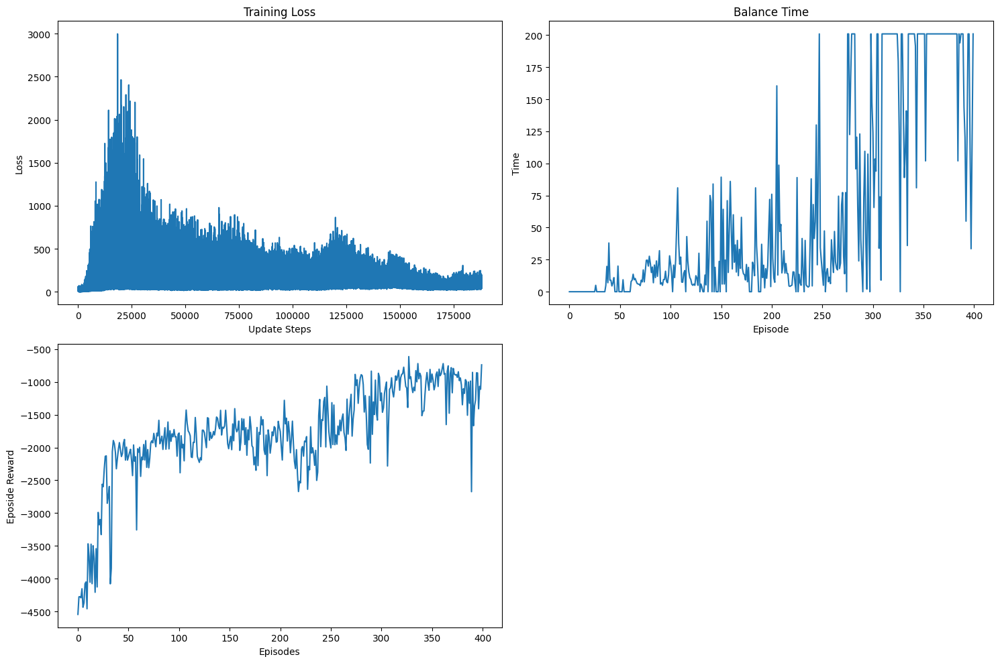

In [73]:
# Load the file
with open(f"training_metrics_{trial_info}.json", "r") as f:
    training_logs = json.load(f)

loss = training_logs["loss"]
rewards = training_logs["episode_reward"]
balance_time = training_logs["balance_time"]

def plot_results(loss, rewards, balance_time):
    plt.figure(figsize=(15, 10))

    # Plot loss
    plt.subplot(2, 2, 1)
    plt.plot(loss)
    plt.title("Training Loss")
    plt.xlabel("Update Steps")
    plt.ylabel("Loss")

    # Plot balance time
    plt.subplot(2, 2, 2)
    plt.plot(balance_time)
    plt.title("Balance Time")
    plt.xlabel("Episode")
    plt.ylabel("Time")

    # Plot rewards
    plt.subplot(2, 2, 3)
    plt.plot(rewards)
    plt.xlabel("Episodes")
    plt.ylabel("Eposide Reward")

    plt.tight_layout()
    plt.savefig(f"training_results_{trial_info}.png")
    plt.show()

plot_results(loss, rewards, balance_time)

In [74]:
def export_weights_to_c_header(model, output_file=f"weights_{trial_info}.h"):
    input_neurons = env.observation_space.shape[0]
    hidden_neurons = 16
    output_neurons = env.action_space.n
    # Extract weights and biases
    weights = []
    biases = []

    for name, param in model.named_parameters():
        if 'weight' in name:
            weights.append(param.detach().cpu().numpy())
        elif 'bias' in name:
            biases.append(param.detach().cpu().numpy())

    # Generate C header file
    with open(output_file, 'w') as f:
        f.write("#ifndef NETWORK_WEIGHTS_H\n")
        f.write("#define NETWORK_WEIGHTS_H\n\n")
        end_line = "{\n"

        # Write input layer weights
        f.write(f"const float input_weights[{hidden_neurons}][{input_neurons}] = {end_line}    ")
        for i in range(hidden_neurons):
            f.write("    {")
            for j in range(input_neurons):
                f.write(f"{weights[0][i][j]:.6f}f")
                if j < input_neurons-1:
                    f.write(", ")
            f.write("},\n")
        f.write("};\n\n")

        # Write input layer bias
        f.write(f"const float input_bias[{hidden_neurons}] = {end_line}    ")
        for i in range(hidden_neurons):
            f.write(f"{biases[0][i]:.6f}f")
            if i < hidden_neurons-1:
                f.write(", ")
            if (i + 1) % 8 == 0:
                f.write("\n    ")
        f.write("\n};\n\n")

        # Write hidden layer 1 weights
        f.write(f"const float hidden1_weights[{hidden_neurons}][{hidden_neurons}] = {end_line}    ")
        for i in range(hidden_neurons):
            f.write("    {")
            for j in range(hidden_neurons):
                f.write(f"{weights[1][i][j]:.6f}f")
                if j < hidden_neurons-1:
                    f.write(", ")
            f.write("},\n")
        f.write("};\n\n")

        # Write hidden layer 1 bias
        f.write(f"const float hidden1_bias[{hidden_neurons}] = {end_line}    ")
        for i in range(hidden_neurons):
            f.write(f"{biases[1][i]:.6f}f")
            if i < hidden_neurons-1:
                f.write(", ")
            if (i + 1) % 8 == 0:
                f.write("\n    ")
        f.write("\n};\n\n")

        # Write hidden layer 2 weights
        f.write(f"const float hidden2_weights[{hidden_neurons}][{hidden_neurons}] = {end_line}    ")
        for i in range(hidden_neurons):
            f.write("    {")
            for j in range(hidden_neurons):
                f.write(f"{weights[2][i][j]:.6f}f")
                if j < hidden_neurons-1:
                    f.write(", ")
            f.write("},\n")
        f.write("};\n\n")

        # Write hidden layer 2 bias
        f.write(f"const float hidden2_bias[{hidden_neurons}] = {end_line}    ")
        for i in range(hidden_neurons):
            f.write(f"{biases[2][i]:.6f}f")
            if i < hidden_neurons-1:
                f.write(", ")
            if (i + 1) % 8 == 0:
                f.write("\n    ")
        f.write("\n};\n\n")

        # Write output layer weights
        f.write(f"const float output_weights[{output_neurons}][{hidden_neurons}] = {end_line}    ")
        for i in range(output_neurons):
            f.write("    {")
            for j in range(hidden_neurons):
                f.write(f"{weights[3][i][j]:.6f}f")
                if j < hidden_neurons-1:
                    f.write(", ")
            f.write("},\n")
        f.write("};\n\n")

        # Write output layer bias
        f.write(f"const float output_bias[{output_neurons}] = {end_line}    ")
        for i in range(output_neurons):
            f.write(f"{biases[3][i]:.6f}f")
            if i < output_neurons-1:
                f.write(", ")
        f.write("\n};\n\n")

        f.write("#endif // NETWORK_WEIGHTS_H\n")

# Load your trained model
model = NeuralNetwork(env.observation_space.shape[0], env.action_space.n)
model.load_state_dict(torch.load(f"agent_{trial_info}.pth"))

# Export weights
export_weights_to_c_header(model)

180.0 0.0
Episode Reward: -492.55


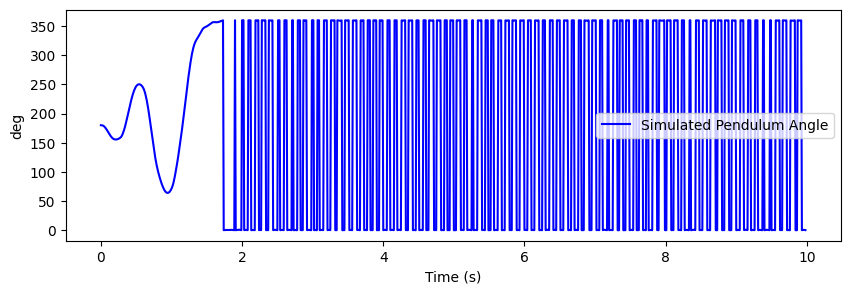

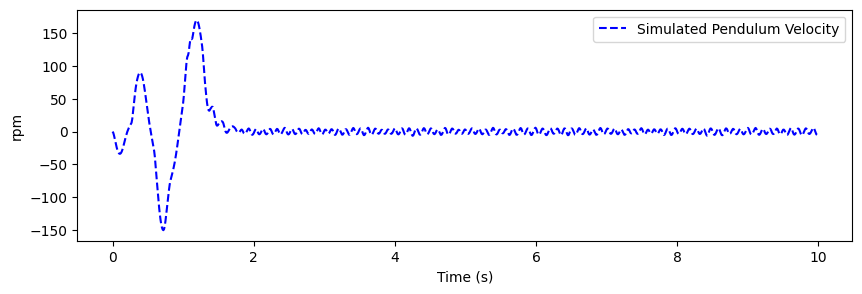

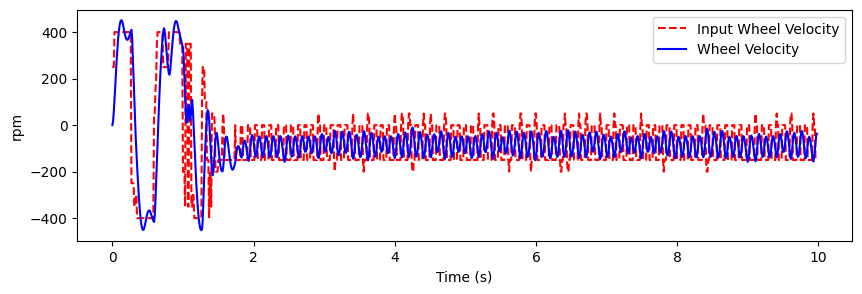

In [75]:
def simulate(ang, vel):
  max_t=5
  target_balance_time=2
  t_step=0.010
  env2 = ReactionWheelPendulumEnv(threshold_angle=10, max_time=max_t, target_balance_time=target_balance_time, time_step=t_step, simulate=False)
  model = NeuralNetwork(env2.observation_space.shape[0], env.action_space.n)

  filepath = f"agent_{trial_info}.pth"
  weights = torch.load(filepath)
  model.load_state_dict(weights)
  model.eval()

  simulation_length = 10/env2.time_step # in seconds

  state, _ = env2.reset()
  env2.state[0] = np.deg2rad(ang)
  env2.state[1] = vel*(np.pi/30)
  state[0], state[1] = env2.state[0], env2.state[1]
  print(np.rad2deg(env2.state[0]), env2.state[1]*(30/np.pi))
  episode_reward = 0
  terminated = False
  truncated = False
  i = 0
  rpm = np.copy(env2.rpm_to_rad_s) * (30/np.pi)
  pAngles, pVelocities, wAngles, wVelocities, iVelocities = [], [], [], [], []
  failed = False
  while not failed:
      i += 1
      if i >= simulation_length:
        break
      # Convert state to tensor
      state_tensor = torch.FloatTensor(state).unsqueeze(0)

      # Get action from model
      with torch.no_grad():
          q_values = model(state_tensor)
          action = q_values.argmax().item()

      pAngle, pVelocity, wVelocity, iVelocity = state[0], state[1], state[2], rpm[action]
      pAngles.append(pAngle)
      pVelocities.append(pVelocity)
      prev_wAngle = 0.0
      if len(wAngles):
        prev_wAngle = wAngles[-1]
      wAngles.append(prev_wAngle + wVelocity*env2.time_step)
      wVelocities.append(wVelocity)
      iVelocities.append(iVelocity)

      # Take action in environment
      state, reward, terminated, truncated, info = env2.step(action)
      episode_reward += reward
      failed = truncated and not terminated
      if failed:
        print("Failed")

  print(f"Episode Reward: {episode_reward:.2f}")

  env2.close()
  pAngles, pVelocities, wVelocities, iVelocities = np.array(pAngles), np.array(pVelocities), np.array(wVelocities), np.array(iVelocities)
  wAngles = np.array(wAngles)


  samplingInterval = env2.time_step*1000 # in ms
  timeStep = env2.time_step
  simulationTime = len(pAngles)
  TIME = np.arange(len(pAngles)) * timeStep

  dqn_simulation_results = {
      "time": TIME,
      "pendulum_angle": np.rad2deg(pAngles) % 360,
      "pendulum_velocity": pVelocities * (30/np.pi),
      "wheel_angle": np.rad2deg(wAngles) % 360,
      "wheel_velocity": wVelocities * (30/np.pi),
      "input_velocity": iVelocities,
  }

  df = pd.DataFrame(dqn_simulation_results)
  df.to_csv(f"simulation_results_{trial_info}.csv", index=False)

  plt.figure(figsize=(10, 3))
  plt.plot(TIME, np.rad2deg(pAngles)%360, label="Simulated Pendulum Angle", color="blue")
  plt.xlabel("Time (s)")
  plt.ylabel("deg")
  plt.legend()

  plt.figure(figsize=(10, 3))
  plt.plot(TIME, pVelocities*(30/np.pi), label="Simulated Pendulum Velocity", color="blue", linestyle="--")
  plt.xlabel("Time (s)")
  plt.ylabel("rpm")
  plt.legend()

  plt.figure(figsize=(10, 3))
  plt.plot(TIME, iVelocities, label="Input Wheel Velocity", color="red", linestyle="--")
  plt.plot(TIME, wVelocities*(30/np.pi), label="Wheel Velocity", color="blue")
  plt.xlabel("Time (s)")
  plt.ylabel("rpm")
  plt.legend()

  plt.show()

  return pAngles, pVelocities, wAngles, wVelocities

ang = 180 # deg
vel = 0 # rpm
pAngles, pVelocities, wAngles, wVelocities = simulate(ang, vel)

In [76]:
from matplotlib.patches import Circle
from matplotlib.lines import Line2D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib as mpl

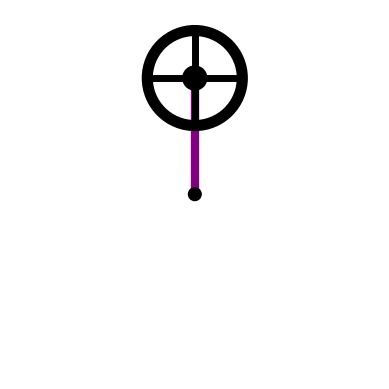

In [77]:
class PendulumAnimation:
  def __init__(self, ARM_LENGTH, ARM_THICKNESS, OUTER_RADIUS, WHEEL_THICKNESS, HUB_RADIUS, SPOKE_WIDTH, ORIGIN_RADIUS):
    self.arm_length = ARM_LENGTH
    self.arm_thickness = ARM_THICKNESS
    self.wheel_radius = OUTER_RADIUS
    self.wheel_thickness = WHEEL_THICKNESS
    self.hub_radius = HUB_RADIUS
    self.spoke_width = SPOKE_WIDTH
    self.origin_radius = ORIGIN_RADIUS

    self.pivot = (0, 0)
    self.pendulum_end = (0, ARM_LENGTH)
    self.wheel_center = (0, ARM_LENGTH)

    self.setup_plot()

  def setup_plot(self):
    self.fig, self.ax = plt.subplots()
    scale = 0.35
    self.ax.set_xlim(-scale, scale)
    self.ax.set_ylim(-scale, scale)
    self.ax.set_aspect('equal')
    self.ax.grid(False)
    self.ax.axis('off')

    self.pendulum_line = Line2D([], [], lw=self.arm_thickness, color='purple', zorder=1)
    self.origin = Circle((0, 0), self.origin_radius, color='black', zorder=2)
    self.spokes = [Line2D([], [], color='black', lw=self.spoke_width, zorder=3) for _ in range(4)]
    self.hub = Circle(self.wheel_center, self.hub_radius, color='black', lw=3, zorder=4)
    self.outer_wheel = Circle(self.wheel_center, self.wheel_radius, fill=False, color='black', lw=self.wheel_thickness, zorder=5)

    self.ax.add_line(self.pendulum_line)
    self.ax.add_patch(self.origin)
    self.ax.add_patch(self.hub)
    self.ax.add_patch(self.outer_wheel)
    for spoke in self.spokes:
        self.ax.add_line(spoke)

  def update(self, state):
    pendulum_angle, _, wheel_angle, _ = state

    x_center, y_center = -self.arm_length * np.sin(pendulum_angle), self.arm_length * np.cos(pendulum_angle)
    self.wheel_center = (x_center, y_center)

    self.pendulum_line.set_data([x_center, 0], [y_center, 0])
    self.origin.center = (0, 0)
    self.hub.center = self.wheel_center
    for i, spoke in enumerate(self.spokes):
        angle = wheel_angle + i * (2*np.pi/len(self.spokes))
        spoke.set_data([x_center, x_center + self.wheel_radius * np.cos(angle)],
                        [y_center, y_center + self.wheel_radius * np.sin(angle)])
    self.outer_wheel.center = self.wheel_center

    return self.pendulum_line, self.origin, *self.spokes, self.hub, self.outer_wheel

  def pendulum_anime_init(self):
    self.update(np.zeros(4))
    return self.pendulum_line, self.origin, *self.spokes, self.hub, self.outer_wheel

  def show(self):
    plt.show()

ARM_LENGTH = 0.22
ARM_THICKNESS = 6
OUTER_RADIUS = 0.09
WHEEL_THICKNESS = 8
HUB_RADIUS = 0.02
SPOKE_WIDTH = 5
ORIGIN_RADIUS = 0.012
pendulum = PendulumAnimation(ARM_LENGTH, ARM_THICKNESS, OUTER_RADIUS, WHEEL_THICKNESS, HUB_RADIUS, SPOKE_WIDTH, ORIGIN_RADIUS)

interval_ms = 10
pendulumAngles = pAngles
wheelAngles = wAngles
frames=len(pendulumAngles)
def update(frame):
  pangle = pendulumAngles[frame]
  wangle = wheelAngles[frame]
  state = [pangle, 0, pangle + wangle, 0]
  return pendulum.update(state)

ani = FuncAnimation(pendulum.fig, update, frames=frames,
                    init_func=pendulum.pendulum_anime_init, blit=False,
                    interval=interval_ms, repeat=True)


In [78]:
HTML(ani.to_jshtml())

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
ani.save(f"animation_{trial_info}.mp4", extra_args=['-vcodec', 'libx264'])